In [8]:
!pip install git+https://github.com/a-r-r-o-w/diffusers@freeinit transformers accelerate

  Cloning https://github.com/a-r-r-o-w/diffusers (to revision freeinit) to /tmp/pip-req-build-3_043q7o
  Running command git clone --filter=blob:none --quiet https://github.com/a-r-r-o-w/diffusers /tmp/pip-req-build-3_043q7o
  Running command git checkout -b freeinit --track origin/freeinit
  Switched to a new branch 'freeinit'
  Branch 'freeinit' set up to track remote branch 'freeinit' from 'origin'.
  Resolved https://github.com/a-r-r-o-w/diffusers to commit dab6a6009b98f0abadd0dec56a75eee155c440d0
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python -m pip install --upgrade pip


In [1]:
import torch
from diffusers import MotionAdapter, AnimateDiffPipeline, DDIMScheduler
from diffusers.utils import export_to_gif
from IPython.display import display, Image

In [2]:
adapter = MotionAdapter.from_pretrained("guoyww/animatediff-motion-adapter-v1-5-2")

The config attributes {'motion_activation_fn': 'geglu', 'motion_attention_bias': False, 'motion_cross_attention_dim': None} were passed to MotionAdapter, but are not expected and will be ignored. Please verify your config.json configuration file.


In [3]:
# model_id = "zhyemmmm/ToonYou"
model_id = "SG161222/Realistic_Vision_V5.1_noVAE"
pipe = AnimateDiffPipeline.from_pretrained(
    model_id, motion_adapter=adapter, torch_dtype=torch.float16
)
scheduler = DDIMScheduler.from_pretrained(
    model_id,
    subfolder="scheduler",
    beta_schedule="linear",
    clip_sample=False,
    timestep_spacing="linspace",
    steps_offset=1,
)
pipe.scheduler = scheduler

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

The config attributes {'center_input_sample': False, 'flip_sin_to_cos': True, 'freq_shift': 0, 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'only_cross_attention': False, 'attention_head_dim': 8, 'dual_cross_attention': False, 'class_embed_type': None, 'addition_embed_type': None, 'num_class_embeds': None, 'upcast_attention': False, 'resnet_time_scale_shift': 'default', 'resnet_skip_time_act': False, 'resnet_out_scale_factor': 1.0, 'time_embedding_type': 'positional', 'time_embedding_dim': None, 'time_embedding_act_fn': None, 'timestep_post_act': None, 'time_cond_proj_dim': None, 'conv_in_kernel': 3, 'conv_out_kernel': 3, 'projection_class_embeddings_input_dim': None, 'class_embeddings_concat': False, 'mid_block_only_cross_attention': None, 'cross_attention_norm': None, 'addition_embed_type_num_heads': 64} were passed to UNetMotionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


In [4]:
pipe = pipe.to("cuda")
pipe.enable_vae_slicing()
# pipe.enable_model_cpu_offload()

In [5]:
prompts = [
    "A cute raccoon playing guitar in a boat on the ocean.",
    "A panda standing on a surfboard in the ocean in sunset.",
    "A robot dancing in Times Square.",
    "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery",
]
negative_prompt = "out of frame, lowres, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, username, watermark, signature"

In [14]:
freeinit_filters = [
    dict(),
    dict(
        method="gaussian",
        spatial_stop_frequency=0.25,
        temporal_stop_frequency=0.25,
    ),
    dict(
        method="butterworth",
        order=4,
        spatial_stop_frequency=0.25,
        temporal_stop_frequency=0.25,
    ),
    dict(
        method="butterworth",
        order=4,
        spatial_stop_frequency=0.4,
        temporal_stop_frequency=0.4,
    ),
    dict(
        method="butterworth",
        order=4,
        spatial_stop_frequency=0.25,
        temporal_stop_frequency=0.25,
        use_fast_sampling=True,
    ),
]

In [17]:
for index, filter in enumerate(freeinit_filters):
    print(filter)
    for prompt_index, prompt in enumerate(prompts):
        print(prompt)
        if filter != {}:
            pipe.enable_free_init(
                **filter, generator=torch.Generator("cpu").manual_seed(42)
            )
        output = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            num_frames=16,
            guidance_scale=8,
            num_inference_steps=20,
            generator=torch.Generator("cpu").manual_seed(1337),
        )
        pipe.disable_free_init()
        frames = output.frames[0]
        filename = f"animation-rv-{index}-{prompt_index}.gif"
        export_to_gif(frames, filename)

{}
A cute raccoon playing guitar in a boat on the ocean.


  0%|          | 0/20 [00:00<?, ?it/s]

A panda standing on a surfboard in the ocean in sunset.


  0%|          | 0/20 [00:00<?, ?it/s]

A robot dancing in Times Square.


  0%|          | 0/20 [00:00<?, ?it/s]

masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery


  0%|          | 0/20 [00:00<?, ?it/s]

{'method': 'gaussian', 'spatial_stop_frequency': 0.25, 'temporal_stop_frequency': 0.25}
A cute raccoon playing guitar in a boat on the ocean.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A panda standing on a surfboard in the ocean in sunset.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A robot dancing in Times Square.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

{'method': 'butterworth', 'order': 4, 'spatial_stop_frequency': 0.25, 'temporal_stop_frequency': 0.25}
A cute raccoon playing guitar in a boat on the ocean.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A panda standing on a surfboard in the ocean in sunset.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A robot dancing in Times Square.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

{'method': 'butterworth', 'order': 4, 'spatial_stop_frequency': 0.4, 'temporal_stop_frequency': 0.4}
A cute raccoon playing guitar in a boat on the ocean.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A panda standing on a surfboard in the ocean in sunset.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A robot dancing in Times Square.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

{'method': 'butterworth', 'order': 4, 'spatial_stop_frequency': 0.25, 'temporal_stop_frequency': 0.25, 'use_fast_sampling': True}
A cute raccoon playing guitar in a boat on the ocean.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A panda standing on a surfboard in the ocean in sunset.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

A robot dancing in Times Square.


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

masterpiece, bestquality, highlydetailed, ultradetailed, sunset, orange sky, warm lighting, fishing boats, ocean waves seagulls, rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, golden hour, coastal landscape, seaside scenery


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [12]:
pipe.enable_free_init(method="butterworth")
print(pipe.free_init_enabled)
output = pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    guidance_scale=7.5,
    num_inference_steps=20,
    generator=torch.Generator("cpu").manual_seed(666),
)
pipe.disable_free_init()
print(pipe.free_init_enabled)

True


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

False


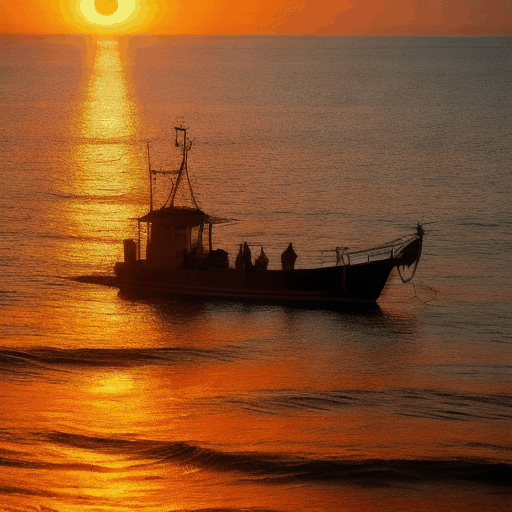

In [13]:
frames = output.frames[0]
export_to_gif(frames, "animation.gif")
display(Image("animation.gif", embed=True))

In [10]:
pipe.enable_free_init(method="gaussian", use_fast_sampling=True)
print(pipe.free_init_enabled)
output = pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    guidance_scale=7.5,
    num_inference_steps=20,
    generator=torch.Generator("cpu").manual_seed(666),
)
pipe.disable_free_init()
print(pipe.free_init_enabled)

True


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

False


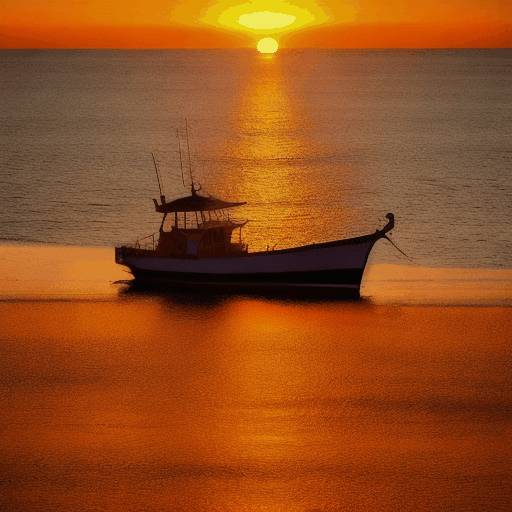

In [11]:
frames = output.frames[0]
export_to_gif(frames, "animation.gif")
display(Image("animation.gif", embed=True))

In [18]:
pipe.enable_free_init(method="gaussian", return_intermediate_results=True)
print(pipe.free_init_enabled)
output = pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    guidance_scale=7.5,
    num_inference_steps=20,
    generator=torch.Generator("cpu").manual_seed(666),
)
pipe.disable_free_init()
print(pipe.free_init_enabled)

True


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

False


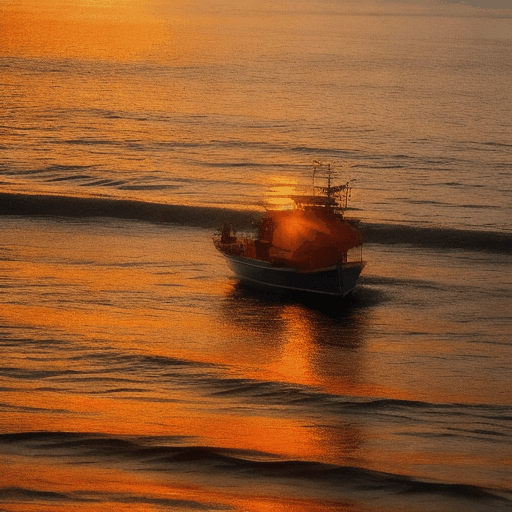

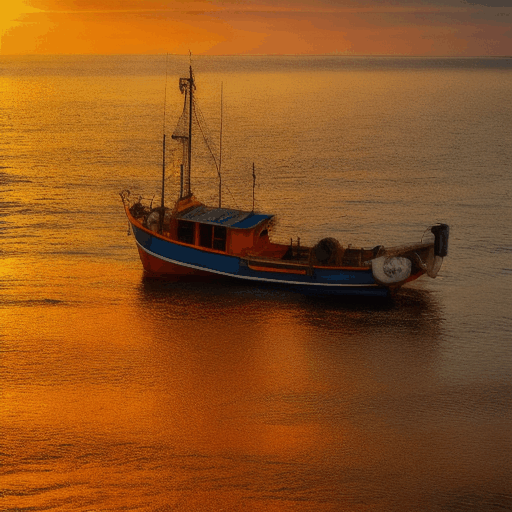

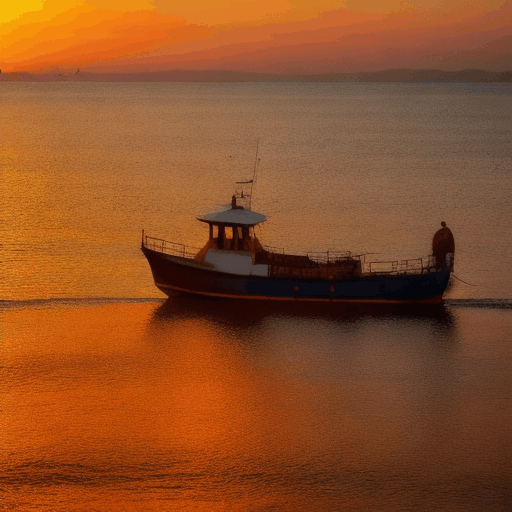

In [20]:
for i, result in enumerate(output):
    frames = result.frames[0]
    export_to_gif(frames, f"animation-{i}.gif")
    display(Image(f"animation-{i}.gif", embed=True))